## 4. Modelling 
### 4.1 Clustering

4.1. Wykonaj klasteryzację danych (wypróbuj do tego celu kilka metod, min. 3) i sprawdź, czy występują jakieś segmenty pożyczkobiorców, wykorzystaj odpowiednie metody do określenia optymalnej liczby klastrów (40 pkt)
 
4.2. Wytrenuj 5 różnych modeli, wykorzystując do każdego inny algorytm, a następnie porównaj ich działanie, za metrykę oceny jakości modelu przyjmij AUROC score. (50pkt)

4.3. Sprawdź działanie wcześniej użytych metod na skompresowanych danych za pomocą PCA, porównaj wyniki (AUROC score) z modelami wytrenowanymi w poprzednim podpunkcie. (20pkt)

4.4. Zbuduj finalny model, którego AUROC score będzie >= 80%, pamiętaj o doborze istotnych zmiennych, kroswalidacji oraz dostrojeniu parametrów modelu, pomyśl również o zbalansowaniu klas. (40pkt)

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
#importing ploting libraries
import matplotlib.pyplot as plt
#importing seaborn for statistical plots
import seaborn as sns
#importing ploting libraries
import matplotlib.pyplot as plt
#styling figures
plt.rc('font',size=14)
sns.set(style='white')
sns.set(style='whitegrid',color_codes=True)
#To enable plotting graphs in Jupyter notebook
%matplotlib inline
#importing the feature scaling library
from sklearn.preprocessing import StandardScaler
#Import Sklearn package's data splitting function which is based on random function
from sklearn.model_selection import train_test_split
# Import Linear Regression, Ridge and Lasso machine learning library
from sklearn.linear_model import LinearRegression, Ridge, Lasso
# Import KNN Regressor machine learning library
from sklearn.neighbors import KNeighborsRegressor
# Import Decision Tree Regressor machine learning library
from sklearn.tree import DecisionTreeRegressor
# Import ensemble machine learning library
from sklearn.ensemble import (RandomForestRegressor, GradientBoostingRegressor,AdaBoostRegressor,BaggingRegressor)
# Import support vector regressor machine learning library
from sklearn.svm import SVR
#Import the metrics
from sklearn import metrics
#Import the Voting regressor for Ensemble
from sklearn.ensemble import VotingRegressor
# Import stats from scipy
from scipy import stats
# Import zscore for scaling
from scipy.stats import zscore
#importing the metrics
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
#importing the K fold
from sklearn.model_selection import KFold
#importing the cross validation score
from sklearn.model_selection import cross_val_score
#importing the preprocessing library
from sklearn import preprocessing
# importing the Polynomial features
from sklearn.preprocessing import PolynomialFeatures
#importing kmeans clustering library
from sklearn.cluster import KMeans
from sklearn.utils import resample

In [2]:
# Uploading data file
loan_main_dummies= pd.read_csv('./loan_main_dummies.csv')
loan_main_dummies.head()

,loan_amnt,funded_amnt,term,installment,grade,sub_grade,emp_length,annual_inc,issue_d,dti,...,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding
0,5000.0,5000.0,36,162.87,1,6,10,24000.0,2011,27.65,...,0,0,0,0,0,0,0,0,0,0
1,2500.0,2500.0,60,59.83,2,13,0,30000.0,2011,1.00,...,0,0,0,0,0,0,0,0,0,0
2,2400.0,2400.0,36,84.33,2,14,10,12252.0,2011,8.72,...,0,0,0,0,0,0,0,1,0,0
3,10000.0,10000.0,36,339.31,2,10,10,49200.0,2011,20.00,...,0,0,0,0,0,1,0,0,0,0
4,3000.0,3000.0,60,67.79,1,9,1,80000.0,2011,17.94,...,0,0,0,0,0,1,0,0,0,0


In [3]:
loan_main_dummies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42535 entries, 0 to 42534
Data columns (total 53 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   loan_amnt                            42535 non-null  float64
 1   funded_amnt                          42535 non-null  float64
 2   term                                 42535 non-null  int64  
 3   installment                          42535 non-null  float64
 4   grade                                42535 non-null  int64  
 5   sub_grade                            42535 non-null  int64  
 6   emp_length                           42535 non-null  int64  
 7   annual_inc                           42535 non-null  float64
 8   issue_d                              42535 non-null  int64  
 9   dti                                  42535 non-null  float64
 10  delinq_2yrs                          42535 non-null  float64
 11  earliest_cr_line            

In [4]:
loan_main_dummies.describe()

,loan_amnt,funded_amnt,term,installment,grade,sub_grade,emp_length,annual_inc,issue_d,dti,...,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding
count,42535.000000,42535.000000,42535.000000,42535.000000,42535.000000,42535.000000,42535.000000,42535.000000,42535.000000,42535.000000,...,42535.000000,42535.000000,42535.000000,42535.000000,42535.000000,42535.000000,42535.000000,42535.000000,42535.000000,42535.000000
mean,11089.722581,10821.585753,42.207218,322.623063,1.670859,10.405125,4.794381,59131.219536,2010.231456,13.373043,...,0.075209,0.010015,0.054332,0.017703,0.014788,0.104032,0.002492,0.046832,0.009404,0.023604
std,7410.938391,7146.914675,10.509342,208.927216,1.438428,7.071285,3.608177,24878.263356,0.966383,6.726315,...,0.263731,0.099575,0.226674,0.131871,0.120704,0.305306,0.049859,0.211281,0.096518,0.151814
min,500.000000,500.000000,36.000000,15.670000,0.000000,0.000000,0.000000,0.000000,2007.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5200.000000,5000.000000,36.000000,165.520000,1.000000,5.000000,2.000000,40000.000000,2010.000000,8.200000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,9700.000000,9600.000000,36.000000,277.690000,1.000000,9.000000,4.000000,59000.000000,2011.000000,13.470000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,15000.000000,15000.000000,60.000000,428.180000,3.000000,15.000000,9.000000,74400.000000,2011.000000,18.680000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,35000.000000,35000.000000,60.000000,1305.190000,6.000000,34.000000,10.000000,126000.000000,2011.000000,29.990000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [5]:
# Checking nulls
round(100*(loan_main_dummies.isnull().sum()/len(loan_main_dummies.index)), 2)

loan_amnt                              0.0
funded_amnt                            0.0
term                                   0.0
installment                            0.0
grade                                  0.0
sub_grade                              0.0
emp_length                             0.0
annual_inc                             0.0
issue_d                                0.0
dti                                    0.0
delinq_2yrs                            0.0
earliest_cr_line                       0.0
inq_last_6mths                         0.0
open_acc                               0.0
pub_rec                                0.0
revol_bal                              0.0
revol_util                             0.0
total_acc                              0.0
last_pymnt_amnt                        0.0
last_credit_pull_d                     0.0
delinq_amnt                            0.0
pub_rec_bankruptcies                   0.0
debt_settlement_flag                   0.0
loan_status

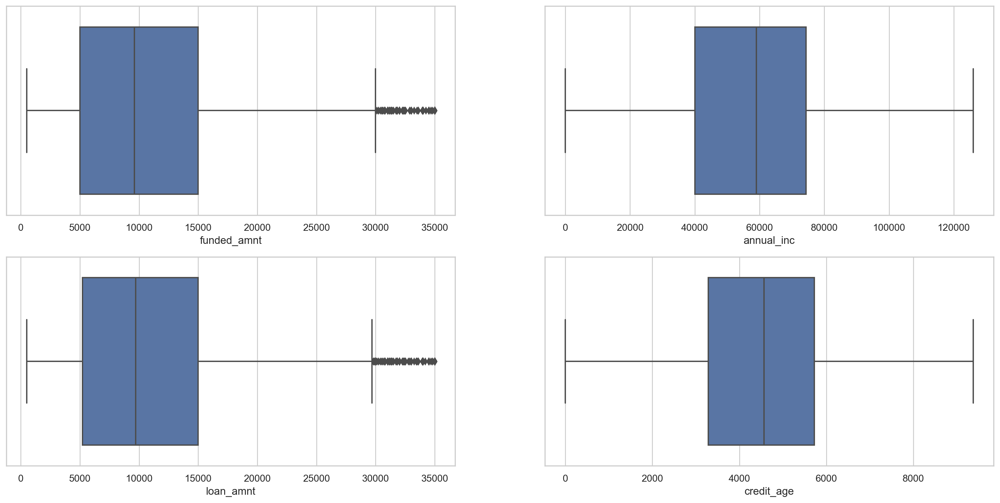

In [6]:
# Checking outliers in few columns

plt.figure(figsize=(20,20), dpi=200)

plt.subplot(4,2,1)
sns.boxplot(x = 'funded_amnt', data = loan_main_dummies)

plt.subplot(4,2,2)
sns.boxplot(x = 'annual_inc', data = loan_main_dummies)

plt.subplot(4,2,3)
sns.boxplot(x = 'loan_amnt', data = loan_main_dummies)

plt.subplot(4,2,4)
sns.boxplot(x = 'credit_age', data = loan_main_dummies)

In [7]:
from scipy import stats

z = np.abs(stats.zscore(loan_main_dummies))
print(z)

print("\n")
print("*******************************************************************************")
print("\n")

# threshold = 3  # selecting 3 as the threshold to identify outliers
print('Ponizej sa punkty odstajace - nr indeksow i odpowiadające im indeksy kolumn w drugim wektorze')
print("\n")
print(np.where(z > 3))

[[0.82173051 0.81456887 0.59064503 ... 0.22165969 0.09743354 0.15548219]
 [1.15907367 1.16437427 1.69306429 ... 0.22165969 0.09743354 0.15548219]
 [1.1725674  1.17836649 0.59064503 ... 4.51142014 0.09743354 0.15548219]
 ...
 [1.15570024 1.16087622 0.59064503 ... 0.22165969 0.09743354 0.15548219]
 [0.61932461 0.60468562 0.59064503 ... 0.22165969 0.09743354 0.15548219]
 [0.82173051 0.81456887 0.59064503 ... 0.22165969 0.09743354 0.15548219]]


*******************************************************************************


Ponizej sa punkty odstajace - nr indeksow i odpowiadające im indeksy kolumn w drugim wektorze


(array([    1,     2,     5, ..., 42533, 42534, 42534]), array([39, 50, 52, ..., 32,  8, 24]))


In [8]:
loan_main_dummies.shape

(42535, 53)

In [9]:
loan_main_dummies_outliers_removed = loan_main_dummies[(z<3).all(axis=1)]

In [10]:
loan_main_dummies_outliers_removed.shape

(21315, 53)

In [11]:
loan_main_dummies_outliers_removed.head()

,loan_amnt,funded_amnt,term,installment,grade,sub_grade,emp_length,annual_inc,issue_d,dti,...,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding
0,5000.0,5000.0,36,162.87,1,6,10,24000.0,2011,27.65,...,0,0,0,0,0,0,0,0,0,0
3,10000.0,10000.0,36,339.31,2,10,10,49200.0,2011,20.00,...,0,0,0,0,0,1,0,0,0,0
4,3000.0,3000.0,60,67.79,1,9,1,80000.0,2011,17.94,...,0,0,0,0,0,1,0,0,0,0
6,7000.0,7000.0,60,170.08,2,14,8,47004.0,2011,23.51,...,0,0,0,0,0,0,0,0,0,0
9,5375.0,5375.0,60,121.45,1,9,0,15000.0,2011,18.08,...,0,0,0,0,0,1,0,0,0,0


In [12]:
# Define dataset
X = loan_main_dummies_outliers_removed.drop('loan_status', axis = 1)
y = loan_main_dummies_outliers_removed.loan_status

In [13]:
X.shape, y.shape

((21315, 52), (21315,))

In [14]:
X.head()

,loan_amnt,funded_amnt,term,installment,grade,sub_grade,emp_length,annual_inc,issue_d,dti,...,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding
0,5000.0,5000.0,36,162.87,1,6,10,24000.0,2011,27.65,...,0,0,0,0,0,0,0,0,0,0
3,10000.0,10000.0,36,339.31,2,10,10,49200.0,2011,20.00,...,0,0,0,0,0,1,0,0,0,0
4,3000.0,3000.0,60,67.79,1,9,1,80000.0,2011,17.94,...,0,0,0,0,0,1,0,0,0,0
6,7000.0,7000.0,60,170.08,2,14,8,47004.0,2011,23.51,...,0,0,0,0,0,0,0,0,0,0
9,5375.0,5375.0,60,121.45,1,9,0,15000.0,2011,18.08,...,0,0,0,0,0,1,0,0,0,0


In [15]:
y.head()

0    1
3    1
4    1
6    1
9    0
Name: loan_status, dtype: int64

In [17]:
## PCA
## Scaling
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [18]:
X_scaled[:5,:5]

array([[-0.95002198, -0.9434859 , -0.57433461, -0.88131493, -0.40296867],
       [-0.16994348, -0.13519829, -0.57433461,  0.08248259,  0.36930945],
       [-1.26205338, -1.26680095,  1.74114529, -1.4006862 , -0.40296867],
       [-0.63799058, -0.62017086,  1.74114529, -0.84193055,  0.36930945],
       [-0.89151609, -0.88286433,  1.74114529, -1.10757027, -0.40296867]])

In [19]:
X.columns

Index(['loan_amnt', 'funded_amnt', 'term', 'installment', 'grade', 'sub_grade',
       'emp_length', 'annual_inc', 'issue_d', 'dti', 'delinq_2yrs',
       'earliest_cr_line', 'inq_last_6mths', 'open_acc', 'pub_rec',
       'revol_bal', 'revol_util', 'total_acc', 'last_pymnt_amnt',
       'last_credit_pull_d', 'delinq_amnt', 'pub_rec_bankruptcies',
       'debt_settlement_flag', 'credit_policy', 'fico_average',
       'FICO_Score_group', 'credit_age', 'as_annual_inc_outlier',
       'as_loan_amnt_outlier', 'loan_amnt_bin', 'home_ownership_MORTGAGE',
       'home_ownership_NONE', 'home_ownership_OTHER', 'home_ownership_OWN',
       'home_ownership_RENT', 'verification_status_Not Verified',
       'verification_status_Source Verified', 'verification_status_Verified',
       'purpose_car', 'purpose_credit_card', 'purpose_debt_consolidation',
       'purpose_educational', 'purpose_home_improvement', 'purpose_house',
       'purpose_major_purchase', 'purpose_medical', 'purpose_moving',
     

In [20]:
X_scaled_df = pd.DataFrame(X_scaled,columns=X.columns)

In [21]:
X_scaled_df.head()

,loan_amnt,funded_amnt,term,installment,grade,sub_grade,emp_length,annual_inc,issue_d,dti,...,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding
0,-0.950022,-0.943486,-0.574335,-0.881315,-0.402969,-0.584927,1.492105,-1.426730,0.780665,2.113149,...,0.0,0.0,0.0,0.0,0.0,-0.406056,0.0,0.0,0.0,0.0
1,-0.169943,-0.135198,-0.574335,0.082483,0.369309,0.050581,1.492105,-0.378575,0.780665,0.909734,...,0.0,0.0,0.0,0.0,0.0,2.462715,0.0,0.0,0.0,0.0
2,-1.262053,-1.266801,1.741145,-1.400686,-0.402969,-0.108296,-1.049770,0.902503,0.780665,0.585677,...,0.0,0.0,0.0,0.0,0.0,2.462715,0.0,0.0,0.0,0.0
3,-0.637991,-0.620171,1.741145,-0.841931,0.369309,0.686089,0.927244,-0.469915,0.780665,1.461889,...,0.0,0.0,0.0,0.0,0.0,-0.406056,0.0,0.0,0.0,0.0
4,-0.891516,-0.882864,1.741145,-1.107570,-0.402969,-0.108296,-1.332200,-1.801072,0.780665,0.607700,...,0.0,0.0,0.0,0.0,0.0,2.462715,0.0,0.0,0.0,0.0


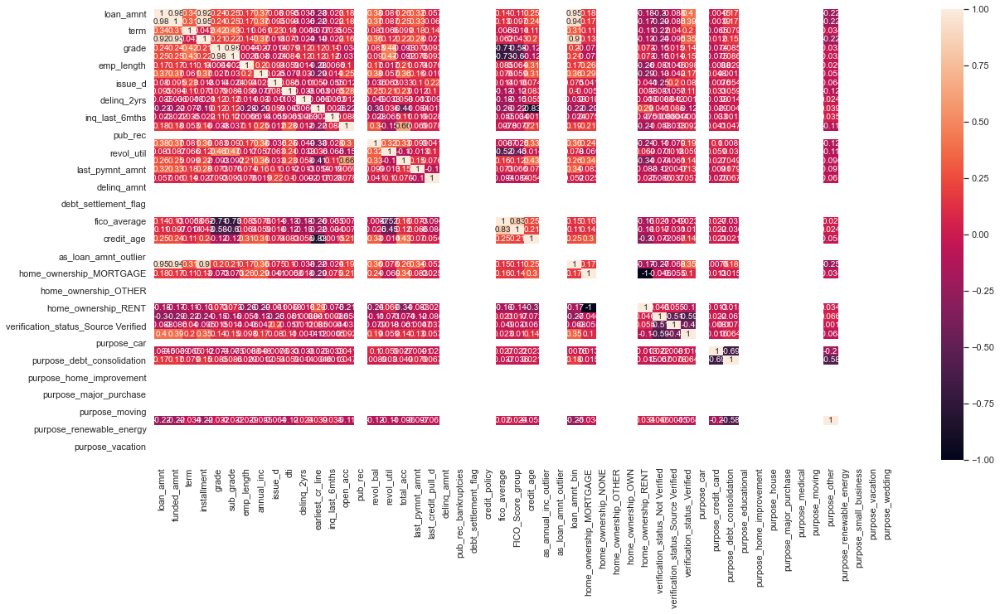

In [22]:
# Correlation map between the scaled features
plt.figure(figsize = (20,10))       
sns.heatmap(X_scaled_df.corr(),annot = True)

In [23]:
from sklearn.decomposition import PCA
pca = PCA(random_state=42)
pca.fit(X_scaled)

PCA(random_state=42)

In [24]:
pca.components_[0]

array([ 3.65176211e-01,  3.63429345e-01,  1.50557502e-01,  3.35209898e-01,
        9.05648877e-02,  9.38124605e-02,  1.37861975e-01,  2.21797776e-01,
        5.31290208e-02,  7.94415942e-02, -1.64657950e-03, -1.92116082e-01,
        9.42208412e-03,  1.56873732e-01, -1.00974196e-28,  2.27981620e-01,
        4.99455478e-02,  2.13230906e-01,  1.49609542e-01,  4.52240085e-02,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        5.37870820e-02,  4.19108257e-02,  2.05628490e-01,  0.00000000e+00,
        0.00000000e+00,  3.57138462e-01,  1.74402267e-01,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00, -1.74402267e-01, -1.49274269e-01,
       -4.31706181e-02,  1.99150074e-01,  0.00000000e+00,  4.60002516e-04,
        8.41899998e-02,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00, -1.14070477e-01,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00])

In [25]:
pca.explained_variance_ratio_

array([1.89395887e-01, 1.31482607e-01, 7.73954060e-02, 5.83328402e-02,
       5.48056109e-02, 5.07629439e-02, 4.26745397e-02, 4.19890760e-02,
       4.01197998e-02, 3.66761559e-02, 3.30705300e-02, 3.21183055e-02,
       3.11871256e-02, 2.78621963e-02, 2.61641067e-02, 2.46775735e-02,
       2.12679630e-02, 2.05803906e-02, 1.53680921e-02, 1.27413847e-02,
       1.00657054e-02, 8.57781621e-03, 5.12586783e-03, 3.51502507e-03,
       2.18318212e-03, 9.18810481e-04, 7.01140639e-04, 2.39918220e-04,
       3.73517527e-32, 1.05997832e-32, 6.38029393e-33, 4.50044536e-33,
       2.85138095e-33, 1.67734110e-33, 1.29690625e-33, 1.29690625e-33,
       1.29690625e-33, 1.29690625e-33, 1.29690625e-33, 1.29690625e-33,
       1.29690625e-33, 1.29690625e-33, 1.29690625e-33, 1.29690625e-33,
       1.29690625e-33, 1.29690625e-33, 1.29690625e-33, 1.29690625e-33,
       1.29690625e-33, 1.29690625e-33, 9.61904038e-34, 1.49349887e-34])

In [26]:
var_cumu = np.cumsum(pca.explained_variance_ratio_)
var_cumu

array([0.18939589, 0.32087849, 0.3982739 , 0.45660674, 0.51141235,
       0.56217529, 0.60484983, 0.64683891, 0.68695871, 0.72363487,
       0.7567054 , 0.7888237 , 0.82001083, 0.84787302, 0.87403713,
       0.8987147 , 0.91998267, 0.94056306, 0.95593115, 0.96867253,
       0.97873824, 0.98731606, 0.99244192, 0.99595695, 0.99814013,
       0.99905894, 0.99976008, 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        ])

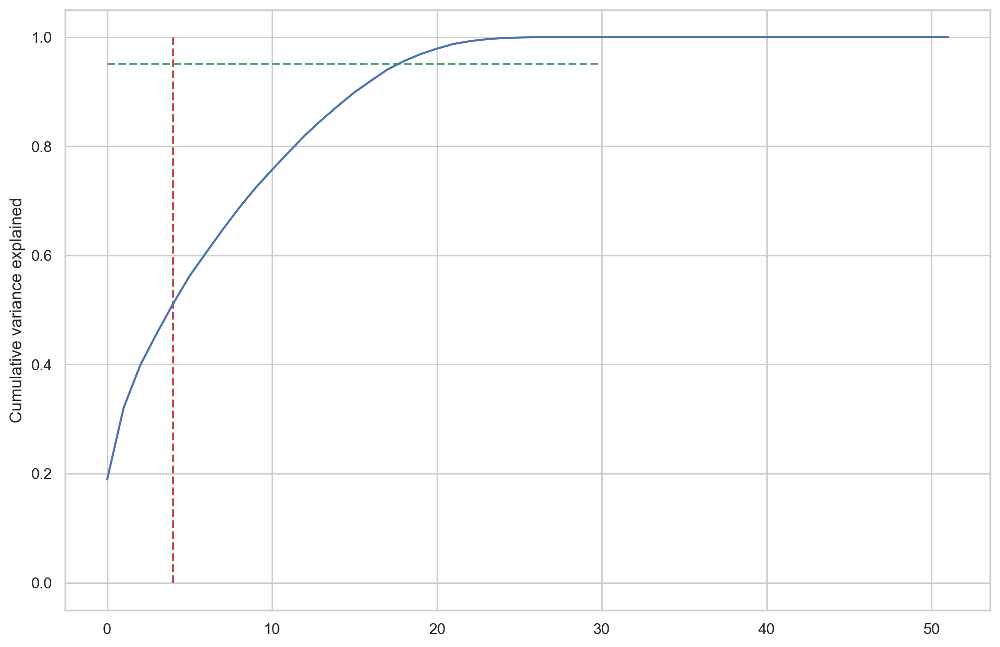

In [27]:
fig = plt.figure(figsize=[12,8],dpi=200)
plt.vlines(x=4, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.95, xmax=30, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumu)
plt.ylabel("Cumulative variance explained")
plt.show()

In [28]:
from sklearn.decomposition import IncrementalPCA
pca_final = IncrementalPCA(n_components=4)
X_pca_final = pca_final.fit_transform(X_scaled)

In [29]:
print(X.shape)
print(X_pca_final.shape)

(21315, 52)
(21315, 4)


In [30]:
corrmat = np.corrcoef(X_pca_final.transpose())

In [31]:
corrmat.shape

(4, 4)

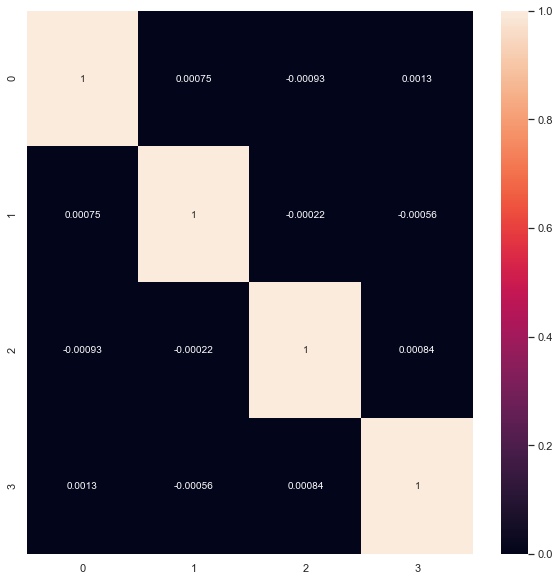

In [32]:
plt.figure(figsize=[10,10])
sns.heatmap(corrmat, annot=True)

In [33]:
colnames = list(X.columns)
pca_df = pd.DataFrame({'PC1':pca.components_[0],'PC2':pca.components_[1], 'Feature':colnames})
pca_df.head()

,PC1,PC2,Feature
0,0.365176,0.059813,loan_amnt
1,0.363429,0.064648,funded_amnt
2,0.150558,0.133001,term
3,0.335210,0.067079,installment
4,0.090565,0.426364,grade


In [34]:
pca_df

,PC1,PC2,Feature
0,3.651762e-01,5.981286e-02,loan_amnt
1,3.634293e-01,6.464791e-02,funded_amnt
2,1.505575e-01,1.330011e-01,term
3,3.352099e-01,6.707949e-02,installment
4,9.056489e-02,4.263641e-01,grade
5,9.381246e-02,4.321044e-01,sub_grade
6,1.378620e-01,-7.366433e-02,emp_length
7,2.217978e-01,-6.599389e-02,annual_inc
8,5.312902e-02,2.193971e-02,issue_d
9,7.944159e-02,6.608822e-02,dti


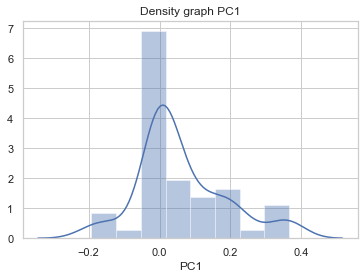

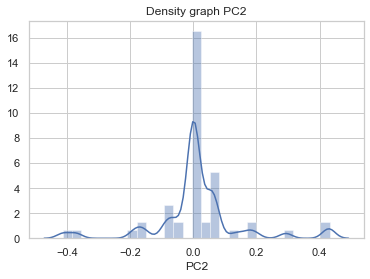

,PC1,PC2,Feature
mean,0.06,0.01,NaN
std,0.13,0.14,NaN
max,0.37,0.43,verification_status_Verified
min,-0.19,-0.41,FICO_Score_group


In [36]:
sns.distplot(pca_df.PC1).set(title = 'Density graph PC1')
plt.show()
sns.distplot(pca_df.PC2).set(title = 'Density graph PC2')
plt.show()
pca_df.agg(['mean', 'std', 'max', 'min']).round(2)

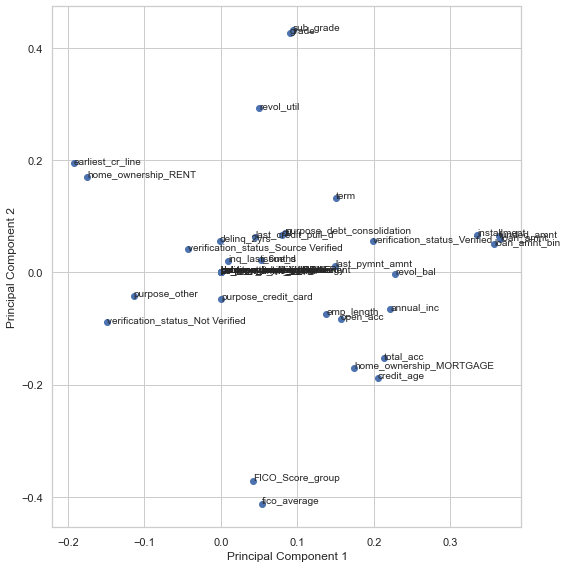

In [37]:
fig = plt.figure(figsize = (8,8))
plt.scatter(pca_df.PC1, pca_df.PC2)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
for i, txt in enumerate(pca_df.Feature):
    plt.annotate(txt, (pca_df.PC1[i],pca_df.PC2[i]))
plt.tight_layout()
plt.show()

In [38]:
## Clustering
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import cut_tree

In [39]:
kmeans = KMeans(n_clusters=5, max_iter=1000)
kmeans.fit(X_pca_final)

KMeans(max_iter=1000, n_clusters=5)

In [40]:
kmeans.labels_

array([1, 4, 4, ..., 1, 3, 3], dtype=int32)

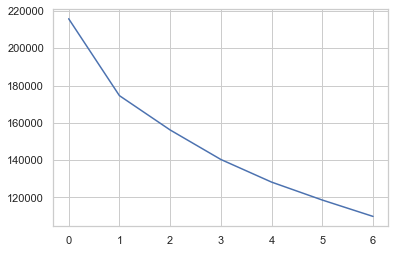

In [41]:
# metoda łokcia - elbow-curve
ssd = [] # Sum of squared distances
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]
for num_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=num_clusters, max_iter=1000)
    kmeans.fit(X_pca_final)
    
    ssd.append(kmeans.inertia_) #Sum of squared distances
    
# plot the SSDs for each n_clusters
# ssd
plt.plot(ssd)

In [42]:
# Silhouette score

range_n_clusters = [2, 3, 4, 5, 6, 7, 8]

for num_clusters in range_n_clusters:
    
    # intialise kmeans
    kmeans = KMeans(n_clusters=num_clusters, max_iter=1000)
    kmeans.fit(X_pca_final)
    
    cluster_labels = kmeans.labels_
    
    # silhouette score
    silhouette_avg = silhouette_score(X_pca_final, cluster_labels)
    print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters, silhouette_avg))

For n_clusters=2, the silhouette score is 0.2575006494287346
For n_clusters=3, the silhouette score is 0.2349534926616146
For n_clusters=4, the silhouette score is 0.1998793549230872
For n_clusters=5, the silhouette score is 0.20831574012518175
For n_clusters=6, the silhouette score is 0.20177973829612067
For n_clusters=7, the silhouette score is 0.2091301387055739
For n_clusters=8, the silhouette score is 0.20607497727236107


In [43]:
kmeans = KMeans(n_clusters=4, max_iter=1000, random_state=42)
kmeans.fit(X_pca_final)

KMeans(max_iter=1000, n_clusters=4, random_state=42)

In [44]:
kmeans.labels_

array([0, 3, 0, ..., 0, 2, 2], dtype=int32)

In [45]:
loan_main_dummies_outliers_removed['K-Means_Cluster_ID'] = kmeans.labels_

<ipython-input-45-6f0abaa0374c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  loan_main_dummies_outliers_removed['K-Means_Cluster_ID'] = kmeans.labels_


In [46]:
loan_main_dummies_outliers_removed.head()

,loan_amnt,funded_amnt,term,installment,grade,sub_grade,emp_length,annual_inc,issue_d,dti,...,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding,K-Means_Cluster_ID
0,5000.0,5000.0,36,162.87,1,6,10,24000.0,2011,27.65,...,0,0,0,0,0,0,0,0,0,0
3,10000.0,10000.0,36,339.31,2,10,10,49200.0,2011,20.00,...,0,0,0,0,1,0,0,0,0,3
4,3000.0,3000.0,60,67.79,1,9,1,80000.0,2011,17.94,...,0,0,0,0,1,0,0,0,0,0
6,7000.0,7000.0,60,170.08,2,14,8,47004.0,2011,23.51,...,0,0,0,0,0,0,0,0,0,2
9,5375.0,5375.0,60,121.45,1,9,0,15000.0,2011,18.08,...,0,0,0,0,1,0,0,0,0,0


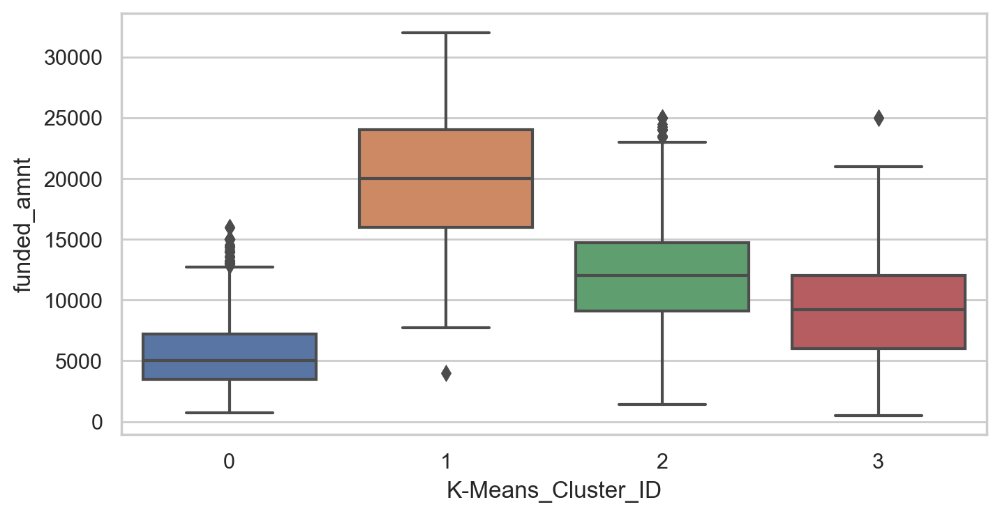

In [47]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='K-Means_Cluster_ID', y='funded_amnt', data=loan_main_dummies_outliers_removed)

- Four different clusters were formed in funded amount feature. Cluster 1 is nicely separated from the others and has the highest funded amount (mean ~20,000 USD).

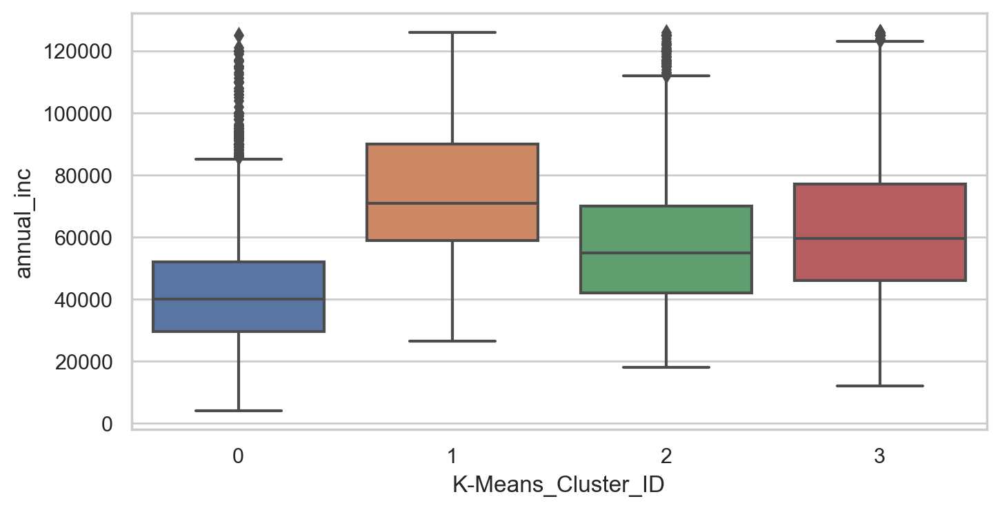

In [48]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='K-Means_Cluster_ID', y='annual_inc', data=loan_main_dummies_outliers_removed)

- There are 4 clusters in annual income feature. Cluster 1 represents borrowers with high income (mean ~70,000 USD), whereas Cluster 0 contains borrowers with the lowest income (mean ~40,000 USD).

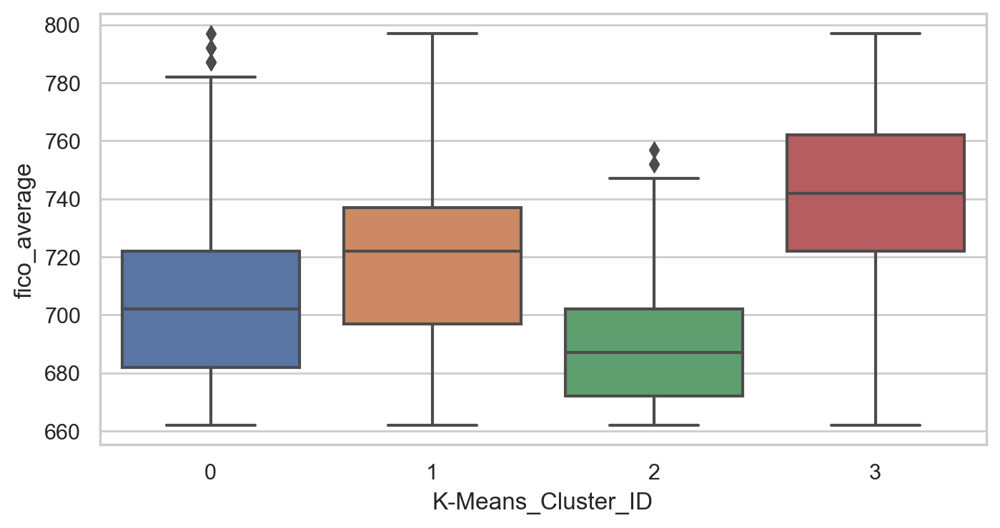

In [49]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='K-Means_Cluster_ID', y='fico_average', data=loan_main_dummies_outliers_removed)

- They are 4 nicely separated clusters in fico_average feature. Cluster 2 represents borrowers with 'Fair' FICO Score.

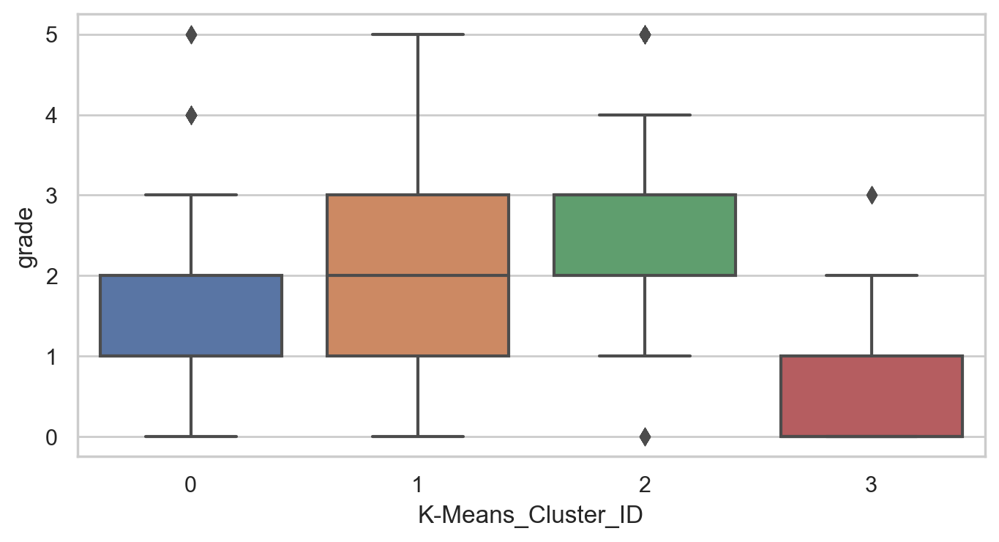

In [51]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='K-Means_Cluster_ID', y='grade', data=loan_main_dummies_outliers_removed)

Cluster 2 represent borrowers with the lowest grade. Cluster 3 contains borrowers with the highest grade. 

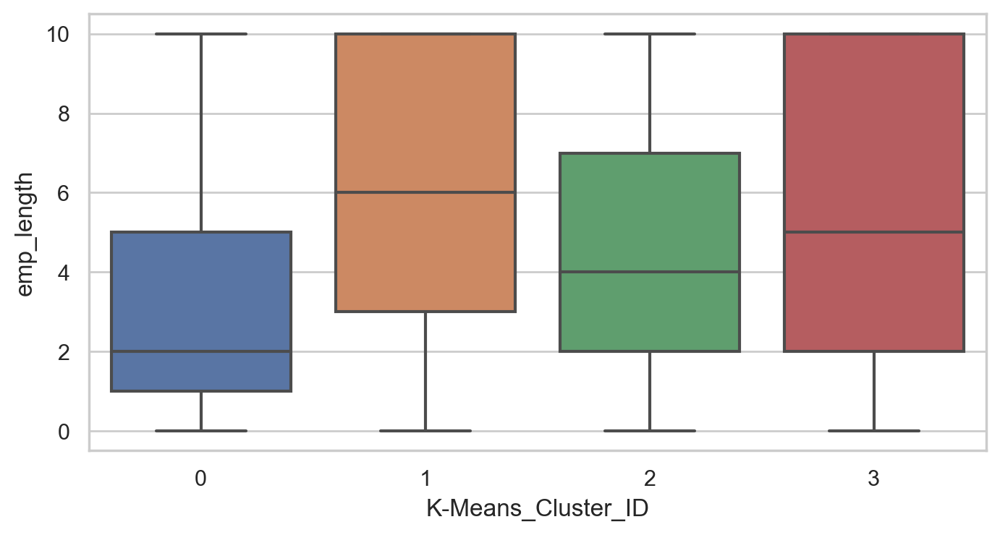

In [52]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='K-Means_Cluster_ID', y='emp_length', data=loan_main_dummies_outliers_removed)

Cluster 0 and 2 reflects borrowers with the lowest employment length, whereas clusters 1 and 3 represent borrowers with longer employment history.

In [53]:
X_scaled_df.head()

,loan_amnt,funded_amnt,term,installment,grade,sub_grade,emp_length,annual_inc,issue_d,dti,...,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding
0,-0.950022,-0.943486,-0.574335,-0.881315,-0.402969,-0.584927,1.492105,-1.426730,0.780665,2.113149,...,0.0,0.0,0.0,0.0,0.0,-0.406056,0.0,0.0,0.0,0.0
1,-0.169943,-0.135198,-0.574335,0.082483,0.369309,0.050581,1.492105,-0.378575,0.780665,0.909734,...,0.0,0.0,0.0,0.0,0.0,2.462715,0.0,0.0,0.0,0.0
2,-1.262053,-1.266801,1.741145,-1.400686,-0.402969,-0.108296,-1.049770,0.902503,0.780665,0.585677,...,0.0,0.0,0.0,0.0,0.0,2.462715,0.0,0.0,0.0,0.0
3,-0.637991,-0.620171,1.741145,-0.841931,0.369309,0.686089,0.927244,-0.469915,0.780665,1.461889,...,0.0,0.0,0.0,0.0,0.0,-0.406056,0.0,0.0,0.0,0.0
4,-0.891516,-0.882864,1.741145,-1.107570,-0.402969,-0.108296,-1.332200,-1.801072,0.780665,0.607700,...,0.0,0.0,0.0,0.0,0.0,2.462715,0.0,0.0,0.0,0.0


In [54]:
# single linkage
sl_mergings = linkage(X_scaled_df, method="single", metric='euclidean')
dendrogram(sl_mergings)
plt.show()

RecursionError: maximum recursion depth exceeded while getting the str of an object

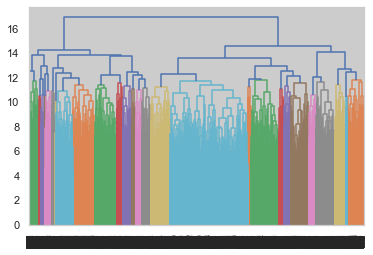

In [55]:
# complete linkage
cl_mergings = linkage(X_scaled_df, method="complete", metric='euclidean')
dendrogram(cl_mergings)
plt.show()

In [56]:
# 4 klastry z complete linkage
cl_cluster_labels = cut_tree(cl_mergings, n_clusters=4).reshape(-1, )
cl_cluster_labels

array([0, 0, 1, ..., 0, 1, 2])

In [59]:
loan_main_dummies_outliers_removed["Hierarchical_Cluster_labels"] = cl_cluster_labels

<ipython-input-59-52bcbf68e297>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  loan_main_dummies_outliers_removed["Hierarchical_Cluster_labels"] = cl_cluster_labels


In [61]:
loan_main_dummies_outliers_removed.head()

,loan_amnt,funded_amnt,term,installment,grade,sub_grade,emp_length,annual_inc,issue_d,dti,...,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding,K-Means_Cluster_ID,Hierarchical_Cluster_labels
0,5000.0,5000.0,36,162.87,1,6,10,24000.0,2011,27.65,...,0,0,0,0,0,0,0,0,0,0
3,10000.0,10000.0,36,339.31,2,10,10,49200.0,2011,20.00,...,0,0,0,1,0,0,0,0,3,0
4,3000.0,3000.0,60,67.79,1,9,1,80000.0,2011,17.94,...,0,0,0,1,0,0,0,0,0,1
6,7000.0,7000.0,60,170.08,2,14,8,47004.0,2011,23.51,...,0,0,0,0,0,0,0,0,2,0
9,5375.0,5375.0,60,121.45,1,9,0,15000.0,2011,18.08,...,0,0,0,1,0,0,0,0,0,0


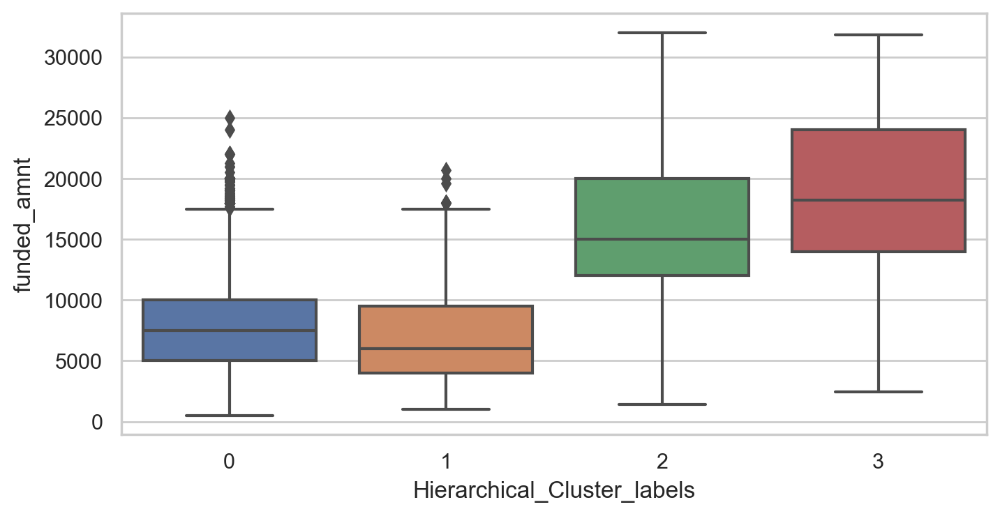

In [62]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='Hierarchical_Cluster_labels', y='funded_amnt', data=loan_main_dummies_outliers_removed)

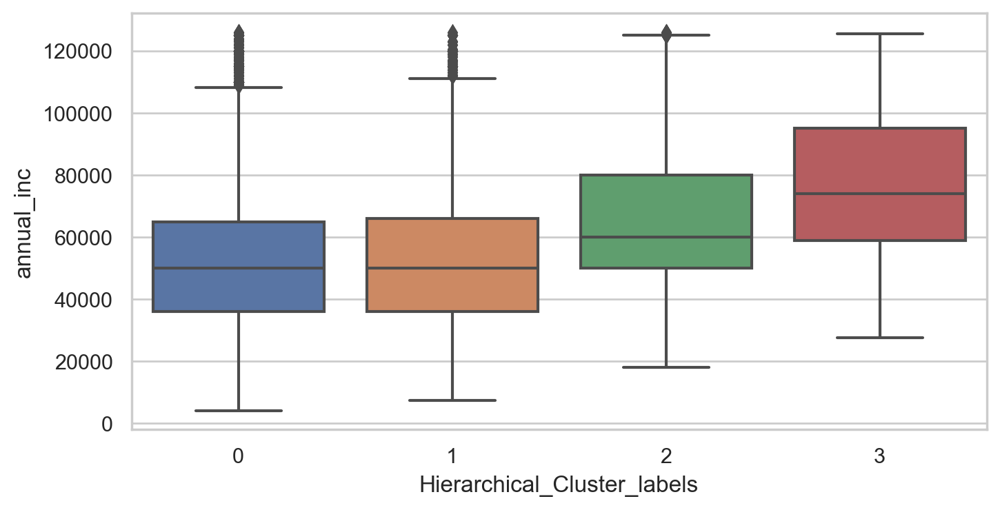

In [63]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='Hierarchical_Cluster_labels', y='annual_inc', data=loan_main_dummies_outliers_removed)

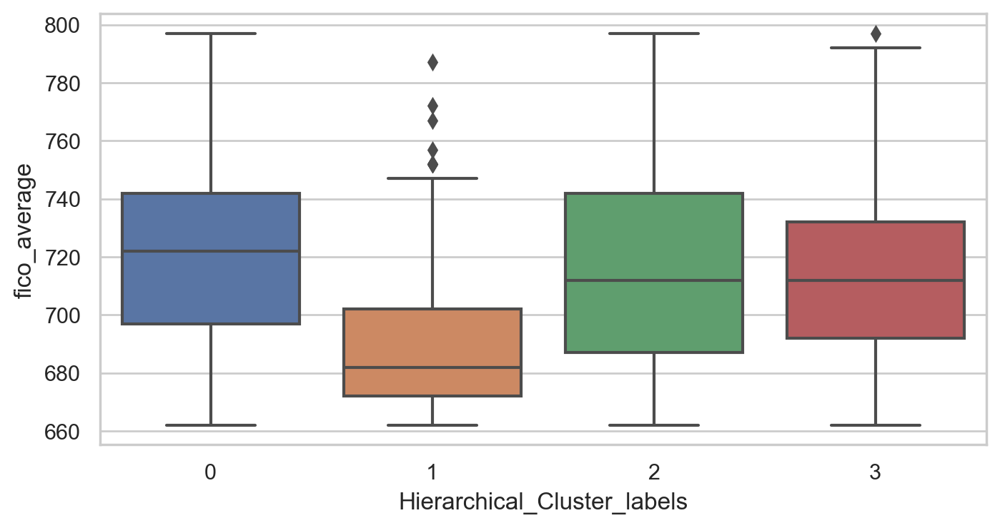

In [64]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='Hierarchical_Cluster_labels', y='fico_average', data=loan_main_dummies_outliers_removed)

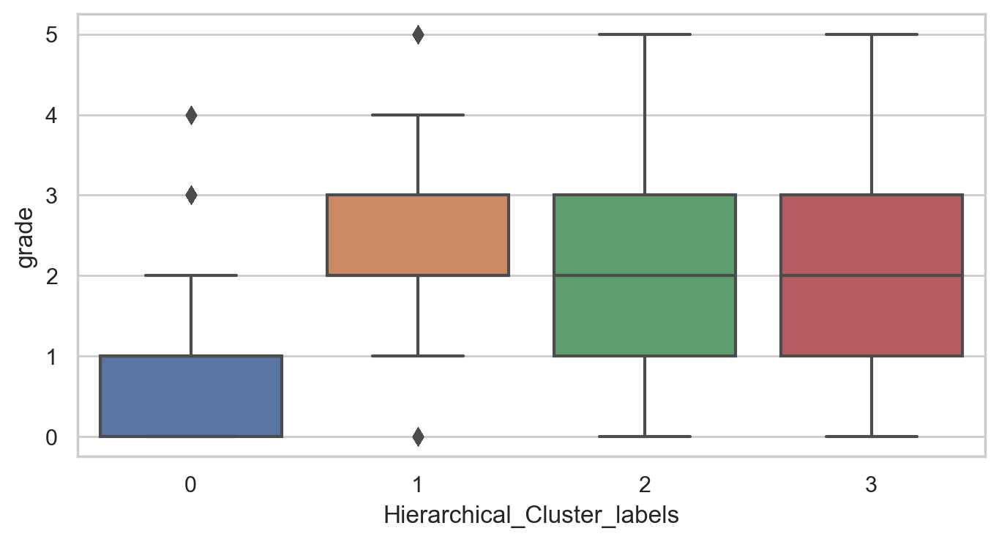

In [65]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='Hierarchical_Cluster_labels', y='grade', data=loan_main_dummies_outliers_removed)

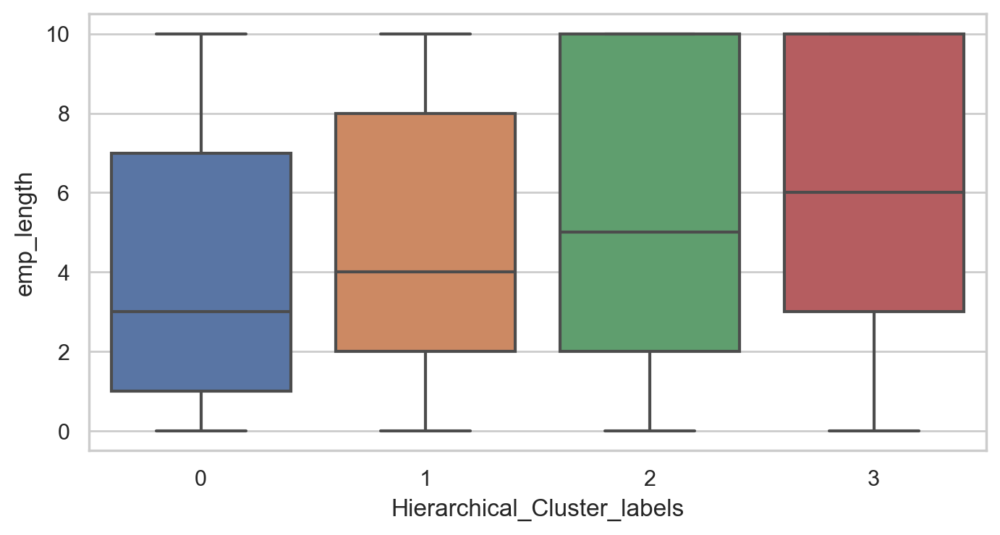

In [66]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='Hierarchical_Cluster_labels', y='emp_length', data=loan_main_dummies_outliers_removed)

In [67]:
loan_main_dummies_outliers_removed.head()

,loan_amnt,funded_amnt,term,installment,grade,sub_grade,emp_length,annual_inc,issue_d,dti,...,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding,K-Means_Cluster_ID,Hierarchical_Cluster_labels
0,5000.0,5000.0,36,162.87,1,6,10,24000.0,2011,27.65,...,0,0,0,0,0,0,0,0,0,0
3,10000.0,10000.0,36,339.31,2,10,10,49200.0,2011,20.00,...,0,0,0,1,0,0,0,0,3,0
4,3000.0,3000.0,60,67.79,1,9,1,80000.0,2011,17.94,...,0,0,0,1,0,0,0,0,0,1
6,7000.0,7000.0,60,170.08,2,14,8,47004.0,2011,23.51,...,0,0,0,0,0,0,0,0,2,0
9,5375.0,5375.0,60,121.45,1,9,0,15000.0,2011,18.08,...,0,0,0,1,0,0,0,0,0,0


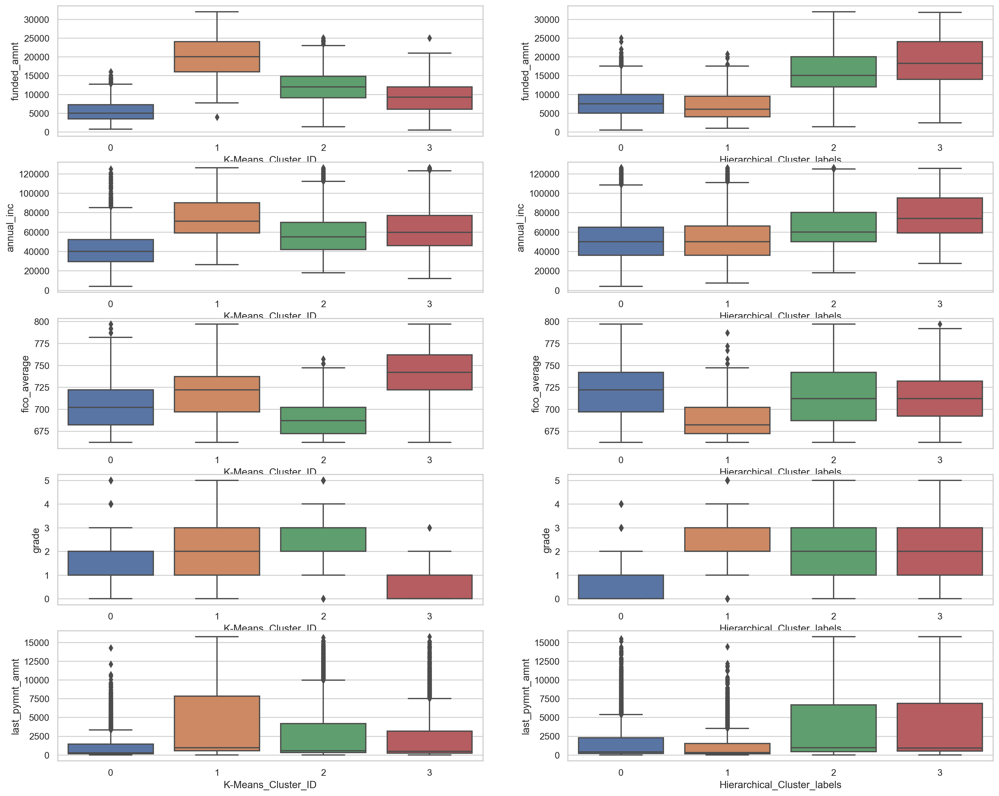

In [69]:
# Comparison: KMeans and Hierarchical clustering

plt.figure(figsize=(20,20), dpi=200)

plt.subplot(6,2,1)
sns.boxplot(x='K-Means_Cluster_ID', y='funded_amnt', data=loan_main_dummies_outliers_removed)

plt.subplot(6,2,2)
sns.boxplot(x='Hierarchical_Cluster_labels', y='funded_amnt', data=loan_main_dummies_outliers_removed)

plt.subplot(6,2,3)
sns.boxplot(x='K-Means_Cluster_ID', y='annual_inc', data=loan_main_dummies_outliers_removed)

plt.subplot(6,2,4)
sns.boxplot(x='Hierarchical_Cluster_labels', y='annual_inc', data=loan_main_dummies_outliers_removed)

plt.subplot(6,2,5)
sns.boxplot(x='K-Means_Cluster_ID', y='fico_average', data=loan_main_dummies_outliers_removed)

plt.subplot(6,2,6)
sns.boxplot(x='Hierarchical_Cluster_labels', y='fico_average', data=loan_main_dummies_outliers_removed)

plt.subplot(6,2,7)
sns.boxplot(x='K-Means_Cluster_ID', y='grade', data=loan_main_dummies_outliers_removed)

plt.subplot(6,2,8)
sns.boxplot(x='Hierarchical_Cluster_labels', y='grade', data=loan_main_dummies_outliers_removed)

plt.subplot(6,2,9)
sns.boxplot(x='K-Means_Cluster_ID', y='last_pymnt_amnt', data=loan_main_dummies_outliers_removed)

plt.subplot(6,2,10)
sns.boxplot(x='Hierarchical_Cluster_labels', y='last_pymnt_amnt', data=loan_main_dummies_outliers_removed)

In [70]:
# Summary table
X_pca_final_df = pd.DataFrame(X_pca_final,columns=['PC1','PC2','PC3','PC4'])

In [71]:
X_pca_final_df.head()

,PC1,PC2,PC3,PC4
0,-1.509267,-0.301605,-0.743855,-2.174813
1,-0.442437,-0.068541,-0.698349,-0.648067
2,-1.515439,-0.190671,-2.296093,-0.545449
3,-1.618223,2.208725,-0.155101,0.792507
4,-3.104416,0.876457,1.356646,-0.908259


In [72]:
X_pca_final_df['K_Means_Cluster_ID'] = kmeans.labels_
X_pca_final_df['Hierarchical_Cluster_Labels'] = cl_cluster_labels

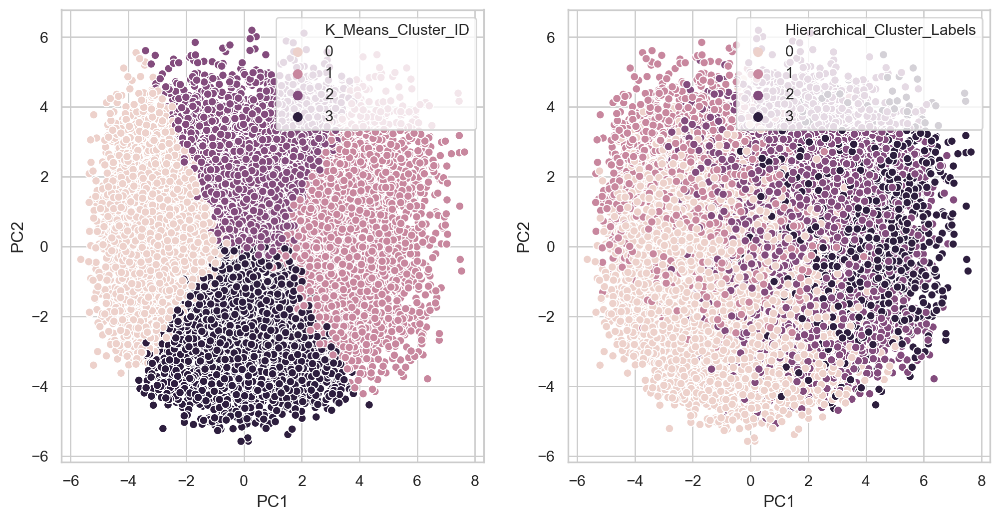

In [73]:
plt.figure(figsize=(12,6),dpi=200)

plt.subplot(1,2,1)
sns.scatterplot(x='PC1',y='PC2',data=X_pca_final_df,hue='K_Means_Cluster_ID')

plt.subplot(1,2,2)
sns.scatterplot(x='PC1',y='PC2',data=X_pca_final_df,hue='Hierarchical_Cluster_Labels')

- Based on the figure above, KMeans clustering has more nicely separated 4 clusters than Hierarchical Clustering.

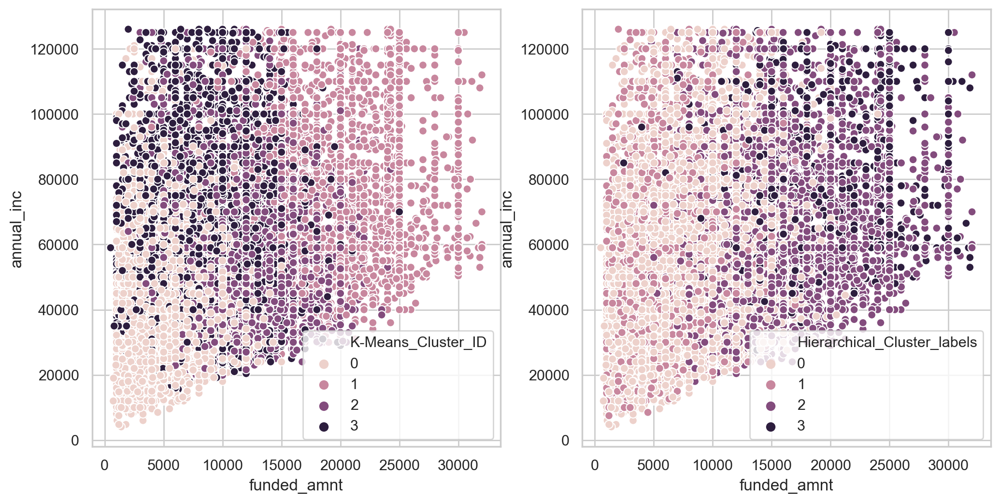

In [74]:
# Scatter plot to observe the cluster distribution per features

plt.figure(figsize=(12,6),dpi=200)

plt.subplot(1,2,1)
sns.scatterplot(x='funded_amnt',y='annual_inc',data=loan_main_dummies_outliers_removed,hue='K-Means_Cluster_ID')

plt.subplot(1,2,2)
sns.scatterplot(x='funded_amnt',y='annual_inc',data=loan_main_dummies_outliers_removed,hue='Hierarchical_Cluster_labels')

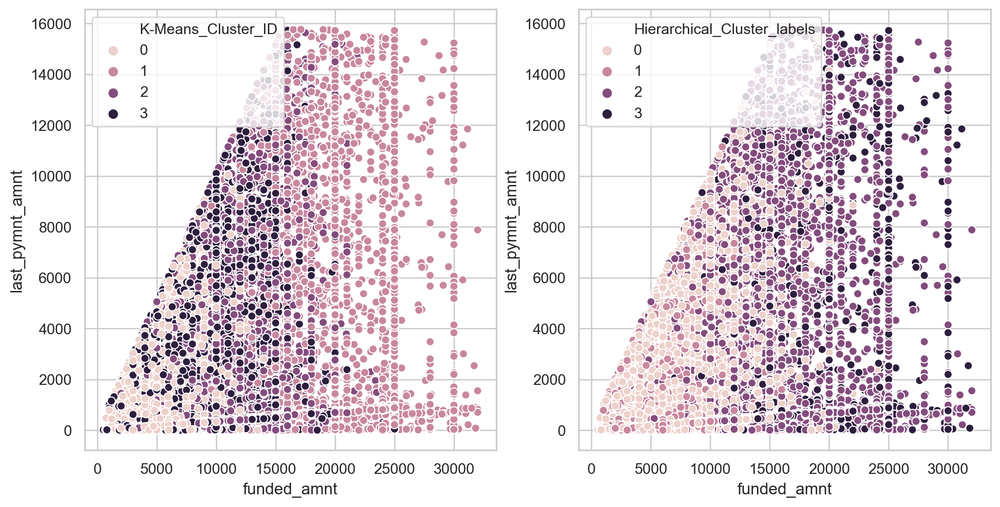

In [75]:
# Scatter plot to observe the cluster distribution per features

plt.figure(figsize=(12,6),dpi=200)

plt.subplot(1,2,1)
sns.scatterplot(x='funded_amnt',y='last_pymnt_amnt',data=loan_main_dummies_outliers_removed,hue='K-Means_Cluster_ID')

plt.subplot(1,2,2)
sns.scatterplot(x='funded_amnt',y='last_pymnt_amnt',data=loan_main_dummies_outliers_removed,hue='Hierarchical_Cluster_labels')

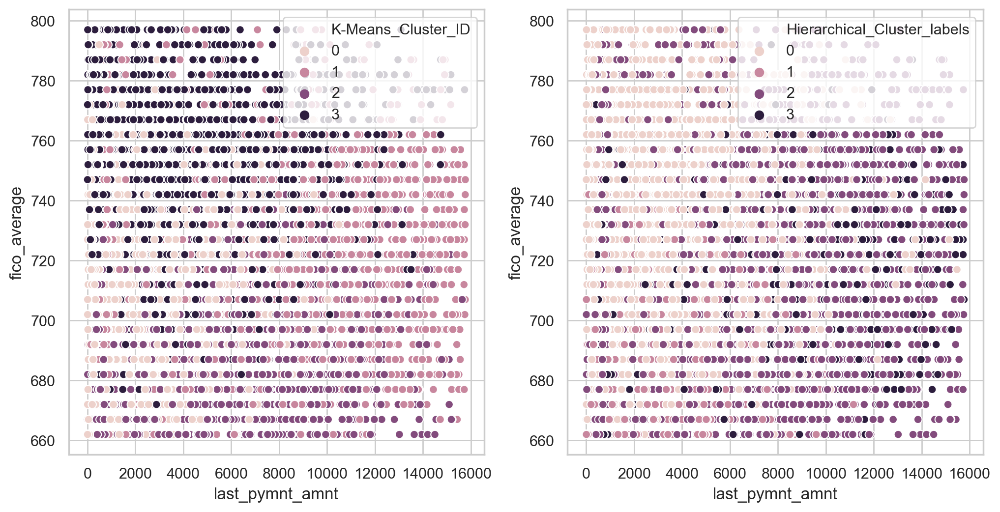

In [84]:
# Scatter plot to observe the cluster distribution per features

plt.figure(figsize=(12,6),dpi=200)

plt.subplot(1,2,1)
sns.scatterplot(x='last_pymnt_amnt',y='fico_average',data=loan_main_dummies_outliers_removed,hue='K-Means_Cluster_ID')

plt.subplot(1,2,2)
sns.scatterplot(x='last_pymnt_amnt',y='fico_average',data=loan_main_dummies_outliers_removed,hue='Hierarchical_Cluster_labels')

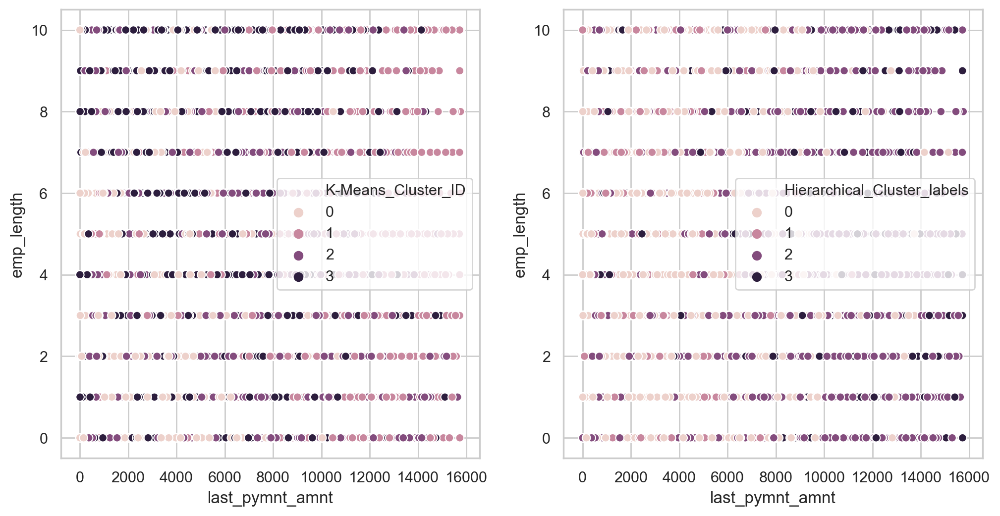

In [85]:
# Scatter plot to observe the cluster distribution per features

plt.figure(figsize=(12,6),dpi=200)

plt.subplot(1,2,1)
sns.scatterplot(x='last_pymnt_amnt',y='emp_length',data=loan_main_dummies_outliers_removed,hue='K-Means_Cluster_ID')

plt.subplot(1,2,2)
sns.scatterplot(x='last_pymnt_amnt',y='emp_length',data=loan_main_dummies_outliers_removed,hue='Hierarchical_Cluster_labels')

In [86]:
K_Means_loans = loan_main_dummies_outliers_removed[loan_main_dummies_outliers_removed['K-Means_Cluster_ID'] == 1]
K_Means_loans

,loan_amnt,funded_amnt,term,installment,grade,sub_grade,emp_length,annual_inc,issue_d,dti,...,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding,K-Means_Cluster_ID,Hierarchical_Cluster_labels
20,20250.0,20250.0,60,484.63,2,13,3,43370.0,2011,26.53,...,0,0,0,0,0,0,0,0,1,2
21,21000.0,21000.0,36,701.73,1,8,10,105000.0,2011,13.22,...,0,0,0,0,0,0,0,0,1,2
25,15000.0,15000.0,36,483.38,1,5,2,92000.0,2011,29.44,...,0,0,0,0,0,0,0,0,1,3
51,25600.0,25600.0,36,824.96,1,5,9,110000.0,2011,15.71,...,0,0,0,0,0,0,0,0,1,3
79,18000.0,18000.0,60,475.99,4,23,10,65000.0,2011,6.81,...,0,0,0,0,0,0,0,0,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39391,25000.0,25000.0,36,819.54,2,11,2,90000.0,2008,17.11,...,0,0,0,0,0,0,0,0,1,3
39395,23000.0,23000.0,36,767.89,3,15,3,95000.0,2008,16.07,...,0,0,0,0,0,0,0,0,1,2
39396,20000.0,20000.0,36,676.78,3,18,2,50000.0,2008,20.42,...,0,0,0,0,0,0,0,0,1,2
39410,25000.0,25000.0,36,880.78,5,27,6,113000.0,2008,24.84,...,0,0,0,0,0,0,0,0,1,3


In [87]:
Hierarchical_loans = loan_main_dummies_outliers_removed[loan_main_dummies_outliers_removed['Hierarchical_Cluster_labels'] == 0]
Hierarchical_loans

,loan_amnt,funded_amnt,term,installment,grade,sub_grade,emp_length,annual_inc,issue_d,dti,...,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding,K-Means_Cluster_ID,Hierarchical_Cluster_labels
0,5000.0,5000.0,36,162.87,1,6,10,24000.0,2011,27.65,...,0,0,0,0,0,0,0,0,0,0
3,10000.0,10000.0,36,339.31,2,10,10,49200.0,2011,20.00,...,0,0,0,1,0,0,0,0,3,0
6,7000.0,7000.0,60,170.08,2,14,8,47004.0,2011,23.51,...,0,0,0,0,0,0,0,0,2,0
9,5375.0,5375.0,60,121.45,1,9,0,15000.0,2011,18.08,...,0,0,0,1,0,0,0,0,0,0
12,9000.0,9000.0,36,305.38,2,10,0,30000.0,2011,10.08,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39519,4725.0,4725.0,36,155.19,2,13,0,19800.0,2008,23.03,...,0,0,0,1,0,0,0,0,0,0
39521,15000.0,15000.0,36,477.07,1,6,10,71000.0,2008,6.88,...,0,0,0,0,0,0,0,0,3,0
39527,4000.0,4000.0,36,125.48,0,3,4,21600.0,2008,10.33,...,0,0,0,0,0,0,0,0,0,0
39530,12000.0,12000.0,36,386.99,1,9,10,100000.0,2008,8.17,...,0,0,0,0,0,0,0,0,3,0


In [88]:
len(Hierarchical_loans)

10087

In [89]:
len(K_Means_loans)

4179

In [91]:
common_loans = pd.merge(K_Means_loans,Hierarchical_loans,how='inner',on=['loan_amnt', 'funded_amnt', 'annual_inc', 'fico_average', 'emp_length', 'grade', 'last_pymnt_amnt', 'K-Means_Cluster_ID','Hierarchical_Cluster_labels'])

In [92]:
common_loans.columns

Index(['loan_amnt', 'funded_amnt', 'term_x', 'installment_x', 'grade',
       'sub_grade_x', 'emp_length', 'annual_inc', 'issue_d_x', 'dti_x',
       ...
       'purpose_home_improvement_y', 'purpose_house_y',
       'purpose_major_purchase_y', 'purpose_medical_y', 'purpose_moving_y',
       'purpose_other_y', 'purpose_renewable_energy_y',
       'purpose_small_business_y', 'purpose_vacation_y', 'purpose_wedding_y'],
      dtype='object', length=101)

In [93]:
common_loans[['funded_amnt', 'annual_inc', 'loan_amnt','fico_average']]

,funded_amnt,annual_inc,loan_amnt,fico_average
0,22000.0,50000.0,22000.0,742.0
1,21000.0,60000.0,21000.0,737.0
2,13475.0,59000.0,20000.0,752.0
3,16500.0,48000.0,16500.0,722.0
4,15900.0,58000.0,15900.0,727.0
...,...,...,...,...
379,18800.0,38000.0,18800.0,712.0
380,13000.0,94000.0,13000.0,702.0
381,14200.0,63000.0,24000.0,727.0
382,15000.0,60480.0,15000.0,732.0


In [94]:
len(common_loans)

384

In [95]:
X_pca_final_df.head()

,PC1,PC2,PC3,PC4,K_Means_Cluster_ID,Hierarchical_Cluster_Labels
0,-1.509267,-0.301605,-0.743855,-2.174813,0,0
1,-0.442437,-0.068541,-0.698349,-0.648067,3,0
2,-1.515439,-0.190671,-2.296093,-0.545449,0,1
3,-1.618223,2.208725,-0.155101,0.792507,2,0
4,-3.104416,0.876457,1.356646,-0.908259,0,0


In [96]:
X_pca_final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21315 entries, 0 to 21314
Data columns (total 6 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   PC1                          21315 non-null  float64
 1   PC2                          21315 non-null  float64
 2   PC3                          21315 non-null  float64
 3   PC4                          21315 non-null  float64
 4   K_Means_Cluster_ID           21315 non-null  int32  
 5   Hierarchical_Cluster_Labels  21315 non-null  int64  
dtypes: float64(4), int32(1), int64(1)
memory usage: 916.0 KB


In [97]:
# Clustering DBSCAN 
from sklearn.cluster import DBSCAN
model_DBSCAN = DBSCAN(eps = 0.3, min_samples=30, leaf_size=60).fit(X_pca_final_df.iloc[:,0:2])
X_pca_final_df['DBSCAN'] = model_DBSCAN.labels_

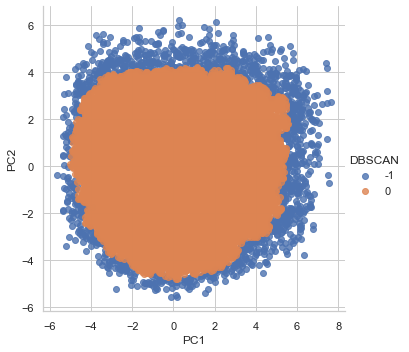

In [98]:
sns.lmplot('PC1', 'PC2', data = X_pca_final_df, fit_reg=False, hue = 'DBSCAN')
plt.show()

In [99]:
silhouette_score(X_pca_final_df[['PC1', 'PC2']], X_pca_final_df['DBSCAN']).round(4)

0.3496

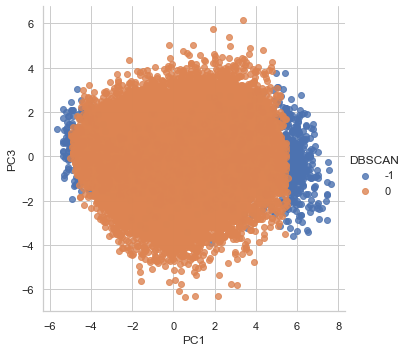

In [100]:
sns.lmplot('PC1', 'PC3', data = X_pca_final_df, fit_reg=False, hue = 'DBSCAN')
plt.show()

In [101]:
silhouette_score(X_pca_final_df[['PC1', 'PC3']], X_pca_final_df['DBSCAN']).round(4)

0.2463

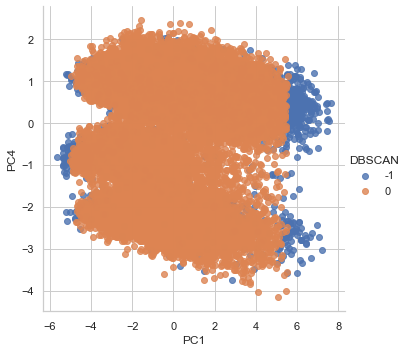

In [102]:
sns.lmplot('PC1', 'PC4', data = X_pca_final_df, fit_reg=False, hue = 'DBSCAN')
plt.show()

In [103]:
silhouette_score(X_pca_final_df[['PC1', 'PC4']], X_pca_final_df['DBSCAN']).round(4)

0.2684

In [104]:
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_row', None)
X_pca_final_df

,PC1,PC2,PC3,PC4,K_Means_Cluster_ID,Hierarchical_Cluster_Labels,DBSCAN
0,-1.509267,-0.301605,-0.743855,-2.174813,0,0,0
1,-0.442437,-0.068541,-0.698349,-0.648067,3,0,0
2,-1.515439,-0.190671,-2.296093,-0.545449,0,1,0
3,-1.618223,2.208725,-0.155101,0.792507,2,0,0
4,-3.104416,0.876457,1.356646,-0.908259,0,0,0
5,-2.103568,1.878471,1.765827,0.570352,0,0,0
6,-3.767559,0.050158,-0.044357,-1.731724,0,0,0
7,0.024383,-1.101136,-0.765114,-0.923421,3,0,0
8,-3.880633,3.164047,-1.409856,1.040690,0,1,0
9,-0.829819,-2.596814,2.011186,0.817612,3,0,0


- Two different clustering methods (KMeans, Hierarchical Clustering) created from 3 to 4 clusters of borrowers.